In [1]:
import keras
import tensorflow as tf

Using TensorFlow backend.


In [2]:
import sys
print(sys.version)
print(keras.__version__)
print(tf.__version__)

3.6.1 (default, Jun 17 2017, 15:31:39) 
[GCC 4.8.4]
2.0.5
1.2.0


In [3]:
import tensorflow as tf
from keras.backend.tensorflow_backend import set_session
config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.3
#config.gpu_options.visible_device_list = "0"
set_session(tf.Session(config=config))

In [4]:
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K

In [17]:
import matplotlib.pyplot as plt

## MNIST data

In [5]:
from keras.datasets import mnist
import numpy as np
(x_train, y_train), (x_test, y_test) = mnist.load_data()

In [6]:
print(x_train.shape)
print(x_test.shape)

(60000, 28, 28)
(10000, 28, 28)


In [7]:
print(y_train.shape)
print(y_test.shape)

(60000,)
(10000,)


In [8]:
batch_size = 128
num_classes = 10
epochs = 12

# input image dimensions
img_rows, img_cols = 28, 28

In [9]:
if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

In [10]:
print(x_train.shape)
print(x_test.shape)

(60000, 28, 28, 1)
(10000, 28, 28, 1)


In [11]:
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

x_train shape: (60000, 28, 28, 1)
60000 train samples
10000 test samples


In [12]:
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)
print(y_train.shape)
print(y_test.shape)

(60000, 10)
(10000, 10)


## CNN

In [13]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=input_shape))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

In [14]:
model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

In [15]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 24, 24, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 12, 12, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 12, 12, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 9216)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               1179776   
_________________________________________________________________
dropout_2 (Dropout)          (None, 128)               0         
__________

In [16]:
model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(x_test, y_test))

Train on 60000 samples, validate on 10000 samples
Epoch 1/12
60000/60000 [==============================] - 9s - loss: 0.3299 - acc: 0.9000 - val_loss: 0.0781 - val_acc: 0.9758
Epoch 2/12
60000/60000 [==============================] - 8s - loss: 0.1142 - acc: 0.9665 - val_loss: 0.0518 - val_acc: 0.9833
Epoch 3/12
60000/60000 [==============================] - 8s - loss: 0.0842 - acc: 0.9755 - val_loss: 0.0449 - val_acc: 0.9855
Epoch 4/12
60000/60000 [==============================] - 8s - loss: 0.0685 - acc: 0.9796 - val_loss: 0.0370 - val_acc: 0.9879
Epoch 5/12
60000/60000 [==============================] - 8s - loss: 0.0606 - acc: 0.9819 - val_loss: 0.0346 - val_acc: 0.9887
Epoch 6/12
60000/60000 [==============================] - 8s - loss: 0.0553 - acc: 0.9828 - val_loss: 0.0327 - val_acc: 0.9895
Epoch 7/12
60000/60000 [==============================] - 8s - loss: 0.0507 - acc: 0.9847 - val_loss: 0.0315 - val_acc: 0.9896
Epoch 8/12
60000/60000 [==============================] - 8s 

In [17]:
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.0287311342212
Test accuracy: 0.9907


## CNN autoencoder

In [13]:
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras import backend as K

input_img = Input(shape=(28, 28, 1))  # adapt this if using `channels_first` image data format

x = Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

# at this point the representation is (4, 4, 8) i.e. 128-dimensional

x = Conv2D(8, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(16, (3, 3), activation='relu')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')

In [30]:
autoencoder.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 28, 28, 16)        160       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 14, 14, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 14, 14, 8)         1160      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 7, 7, 8)           584       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 4, 4, 8)           0         
__________

Run on the server:

tensorboard --logdir=/tmp/autoencoder

In [15]:
from keras.callbacks import TensorBoard

autoencoder.fit(x_train, x_train,
                epochs=50,
                batch_size=128,
                shuffle=True,
                validation_data=(x_test, x_test),
                callbacks=[TensorBoard(log_dir='/tmp/autoencoder')])

Train on 60000 samples, validate on 10000 samples
Epoch 1/50
60000/60000 [==============================] - 7s - loss: 0.2333 - val_loss: 0.1822
Epoch 2/50
60000/60000 [==============================] - 6s - loss: 0.1663 - val_loss: 0.1547
Epoch 3/50
60000/60000 [==============================] - 5s - loss: 0.1479 - val_loss: 0.1421
Epoch 4/50
60000/60000 [==============================] - 5s - loss: 0.1379 - val_loss: 0.1333
Epoch 5/50
60000/60000 [==============================] - 5s - loss: 0.1314 - val_loss: 0.1303
Epoch 6/50
60000/60000 [==============================] - 5s - loss: 0.1268 - val_loss: 0.1229
Epoch 7/50
60000/60000 [==============================] - 5s - loss: 0.1240 - val_loss: 0.1217
Epoch 8/50
60000/60000 [==============================] - 5s - loss: 0.1216 - val_loss: 0.1203
Epoch 9/50
60000/60000 [==============================] - 5s - loss: 0.1196 - val_loss: 0.1174
Epoch 10/50
60000/60000 [==============================] - 5s - loss: 0.1174 - val_loss: 0.1166

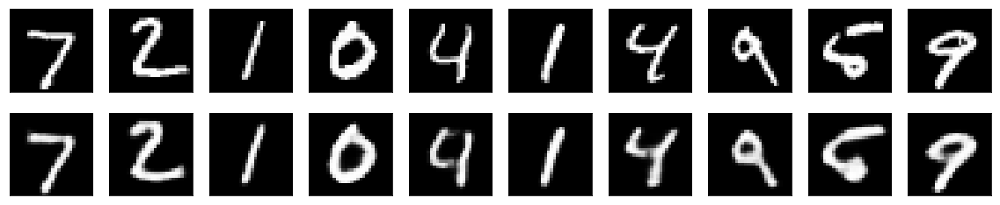

In [19]:
decoded_imgs = autoencoder.predict(x_test)

n = 10
plt.figure(figsize=(20, 4))
for i in range(n):
    # display original
    ax = plt.subplot(2, n, i+1)
    plt.imshow(x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, n, i + n + 1)
    plt.imshow(decoded_imgs[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [20]:
score = autoencoder.evaluate(x_test, x_test)

 9760/10000 [============================>.] - ETA: 0s

In [21]:
score

0.099912175631523131

In [23]:
cnn_encoder = Model(input_img, encoded)

In [25]:
x_test.shape

(10000, 28, 28, 1)

In [26]:
encoded_imgs = cnn_encoder.predict(x_test)

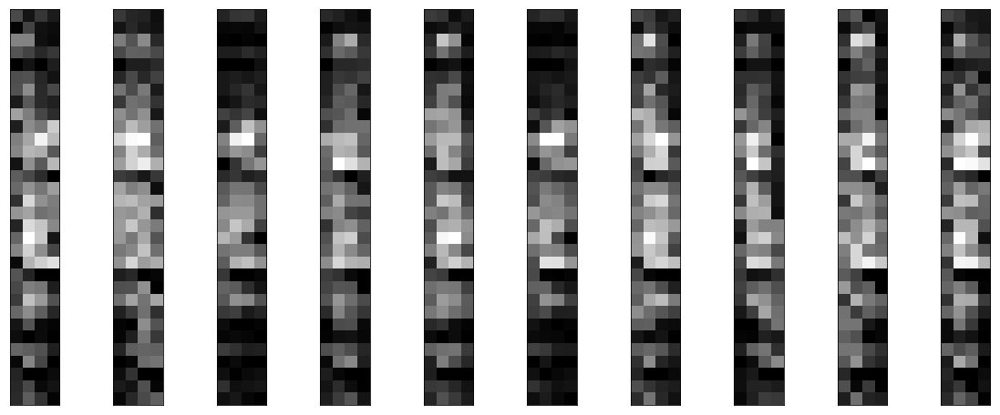

In [29]:
n = 10
plt.figure(figsize=(20, 8))
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(encoded_imgs[i].reshape(4, 4 * 8).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

## Model saving

In [31]:
autoencoder.save("cnn_autoencoder.h5")

In [32]:
from keras.models import load_model

In [33]:
del autoencoder

In [34]:
restored_model = load_model("cnn_autoencoder.h5")

In [35]:
restored_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 28, 28, 16)        160       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 14, 14, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 14, 14, 8)         1160      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 7, 7, 8)           584       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 4, 4, 8)           0         
__________

## CNN visualization

In [37]:
from keras.applications import VGG16

cnn = VGG16(weights='imagenet',
            include_top=True,
            input_shape=(224, 224, 3))

552960000/553467096 [============================>.] - ETA: 0s

In [41]:
cnn.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [38]:
img_path = '/home/ubuntu/giraffe.jpg'

from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(224, 224))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.

print(img_tensor.shape)

(1, 224, 224, 3)


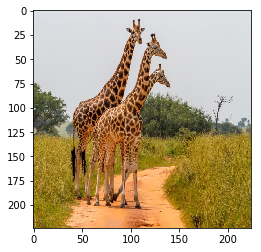

In [40]:
plt.imshow(img_tensor[0])
plt.show()

In [85]:
layer_outputs = [layer.output for layer in cnn.layers[:19]]

# Creates a model that will return these outputs, given the model input:
activation_model = Model(cnn.input, layer_outputs)

In [86]:
activation_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [87]:
activations = activation_model.predict(img_tensor)

In [88]:
len(activations)

19

In [89]:
first_layer_activation = activations[0]

In [90]:
first_layer_activation.shape

(1, 224, 224, 3)

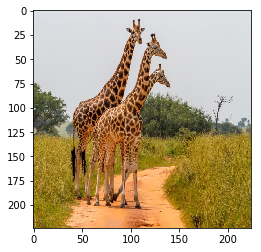

In [91]:
plt.imshow(first_layer_activation[0, :, :, :])
plt.show()

In [92]:
block1_conv1_activation = activations[1]
block1_conv1_activation.shape

(1, 224, 224, 64)

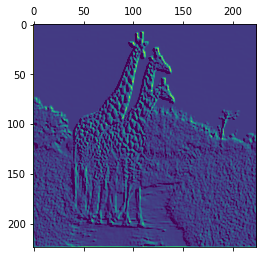

In [93]:
plt.matshow(block1_conv1_activation[0, :, :, 42], cmap='viridis')
plt.show()

In [94]:
block2_pool_activation = activations[6]
block2_pool_activation.shape

(1, 56, 56, 128)

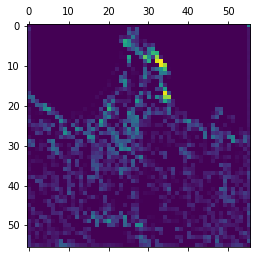

In [95]:
plt.matshow(block2_pool_activation[0, :, :, 42], cmap='viridis')
plt.show()

In [98]:
layer_names = []
for layer in activation_model.layers:
    #if isinstance(layer, keras.layers.Conv2D):
        layer_names.append(layer.name)

In [99]:
layer_names

['input_2',
 'block1_conv1',
 'block1_conv2',
 'block1_pool',
 'block2_conv1',
 'block2_conv2',
 'block2_pool',
 'block3_conv1',
 'block3_conv2',
 'block3_conv3',
 'block3_pool',
 'block4_conv1',
 'block4_conv2',
 'block4_conv3',
 'block4_pool',
 'block5_conv1',
 'block5_conv2',
 'block5_conv3',
 'block5_pool']

In [100]:
images_per_row = 16

In [101]:
def visualize_activations(layer, layer_activation):
        layer_name = layer.name
        # This is the number of features in the feature map
        n_features = layer_activation.shape[-1]
        # The feature map has shape (1, size, size, n_features)
        size = layer_activation.shape[1]
        # We will tile the activation channels in this matrix
        n_cols = int(n_features / images_per_row)
        display_grid = np.zeros((size * n_cols, images_per_row * size))
        # We'll tile each filter into this big horizontal grid
        for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0, :, :, col * images_per_row + row]
                # Post-process the feature to make it visually palatable
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image
        # Display the grid
        scale = 1. / size
        plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
        plt.show()    

block1_conv1


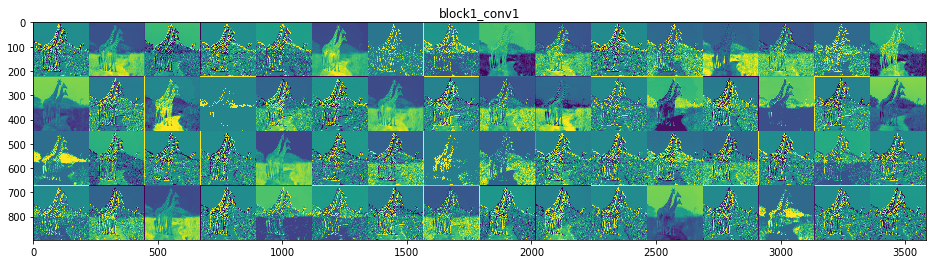

block1_conv2


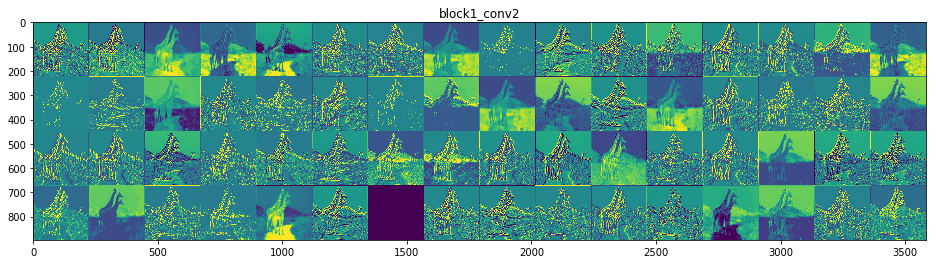

block1_pool


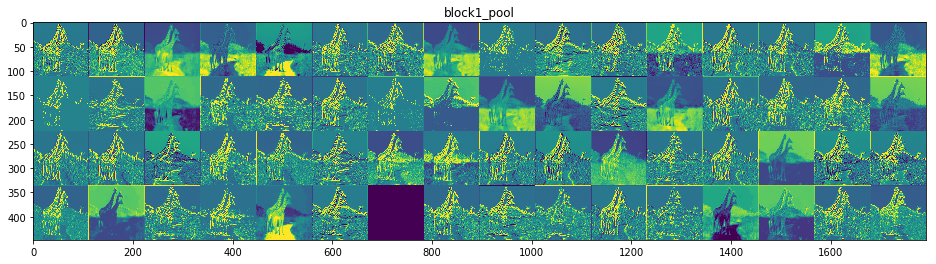

block2_conv1


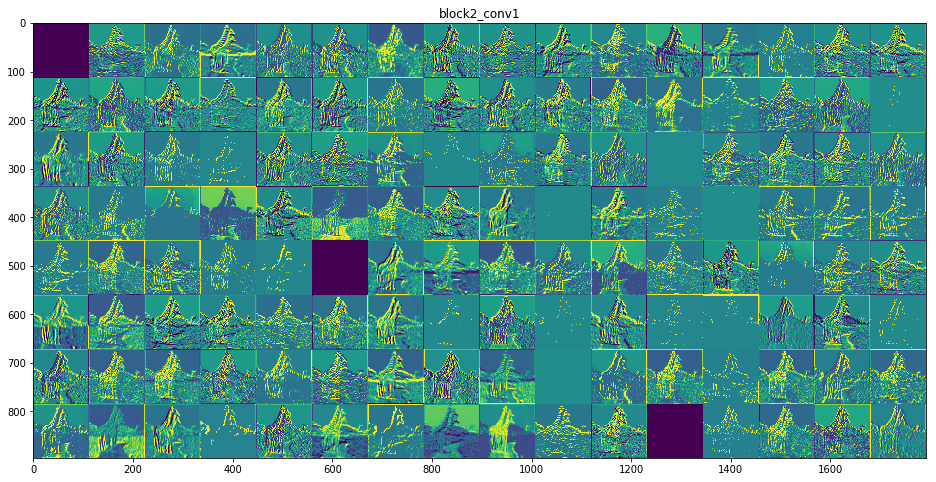

block2_conv2


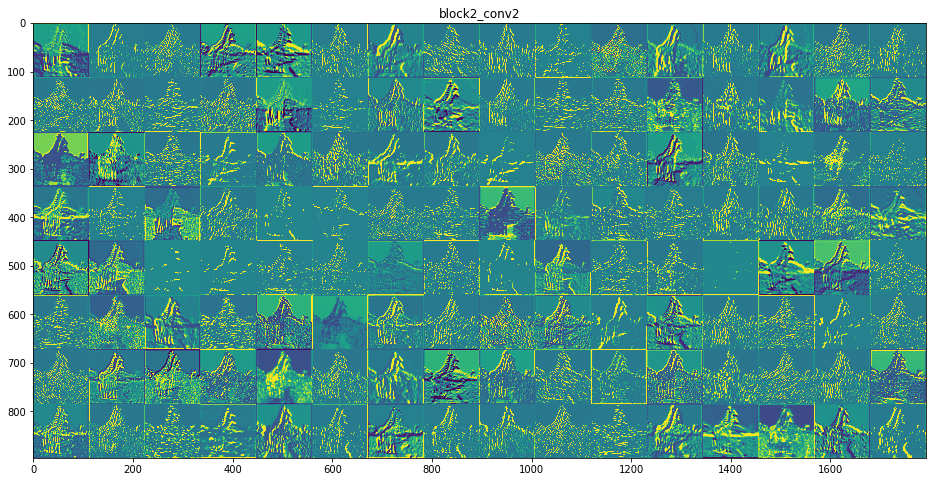

block2_pool


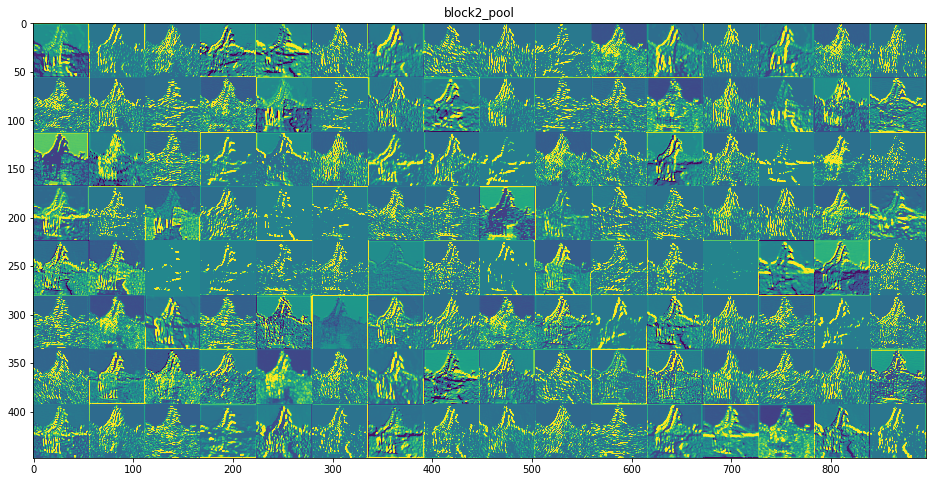

block3_conv1


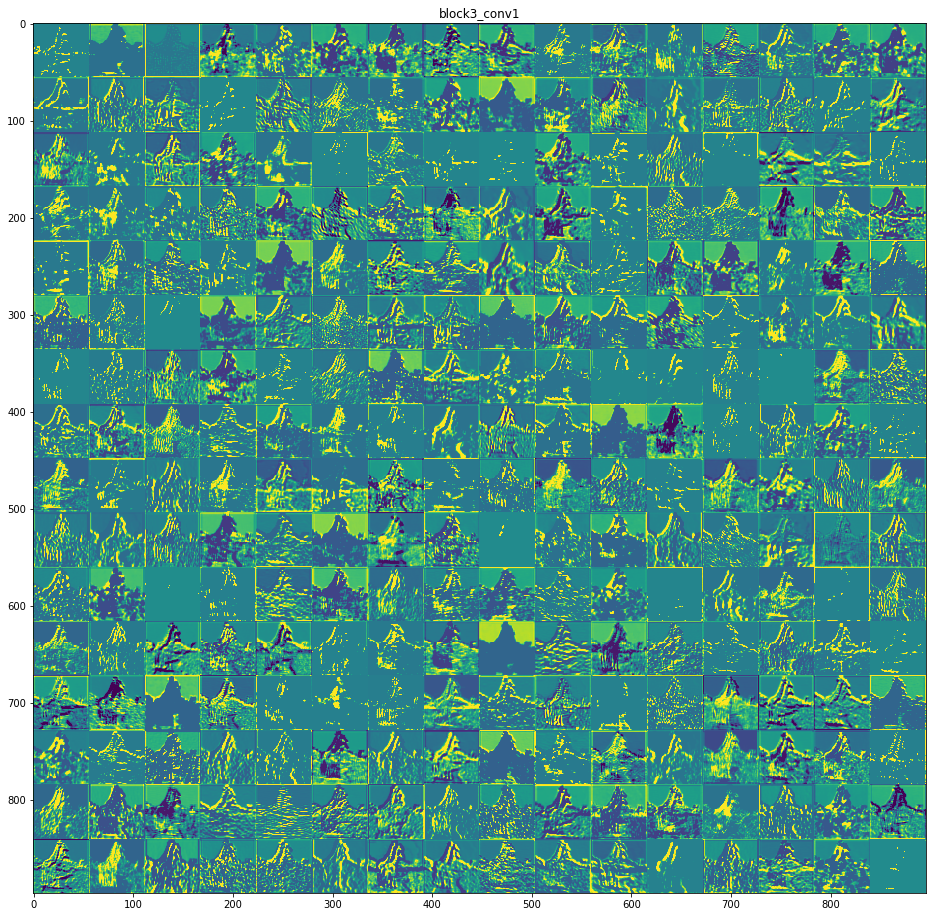

block3_conv2


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


block3_conv3


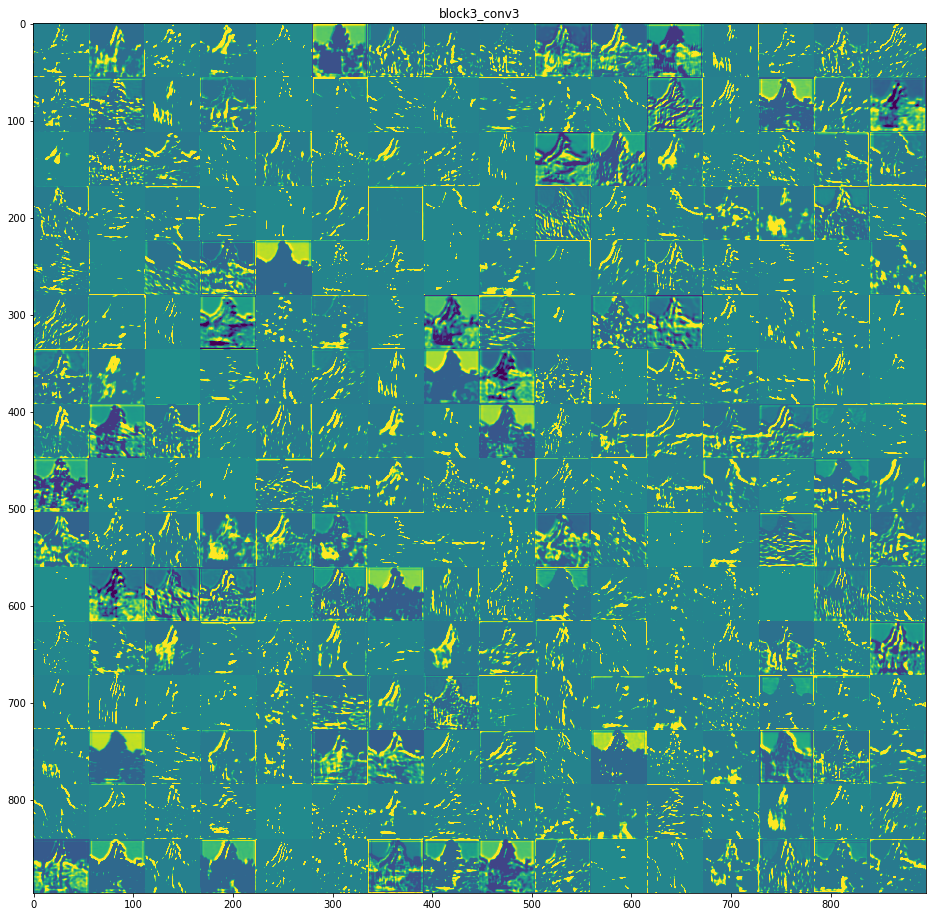

block3_pool


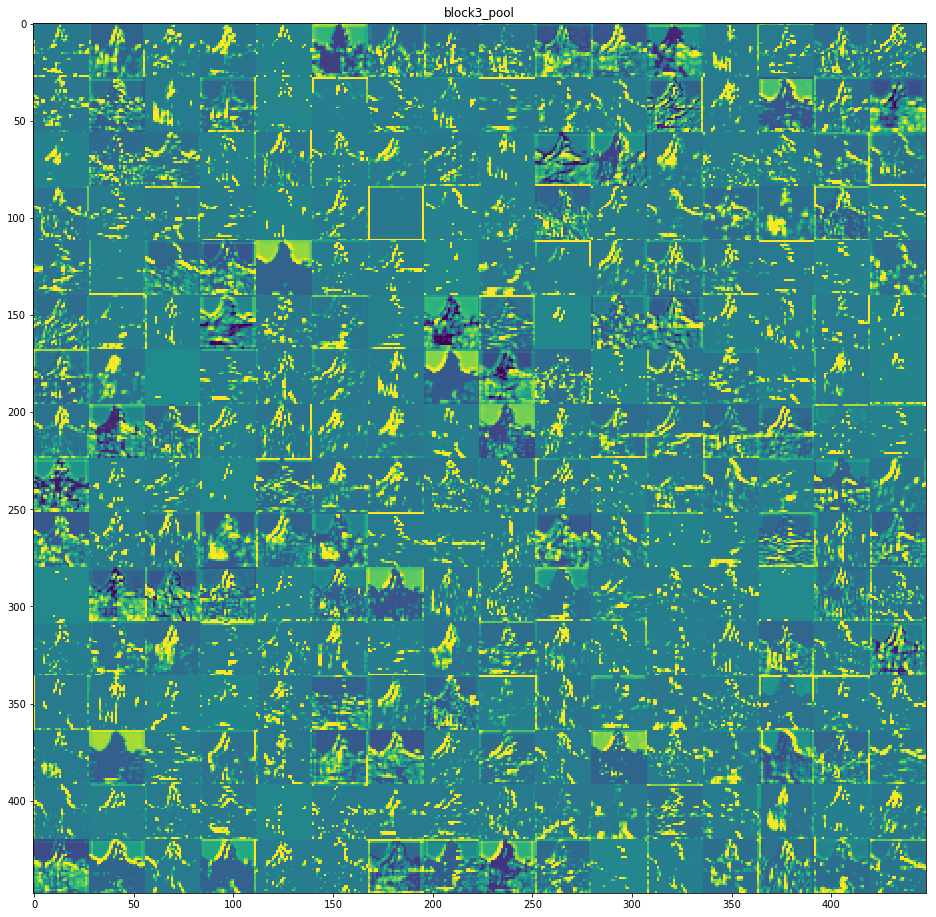

block4_conv1


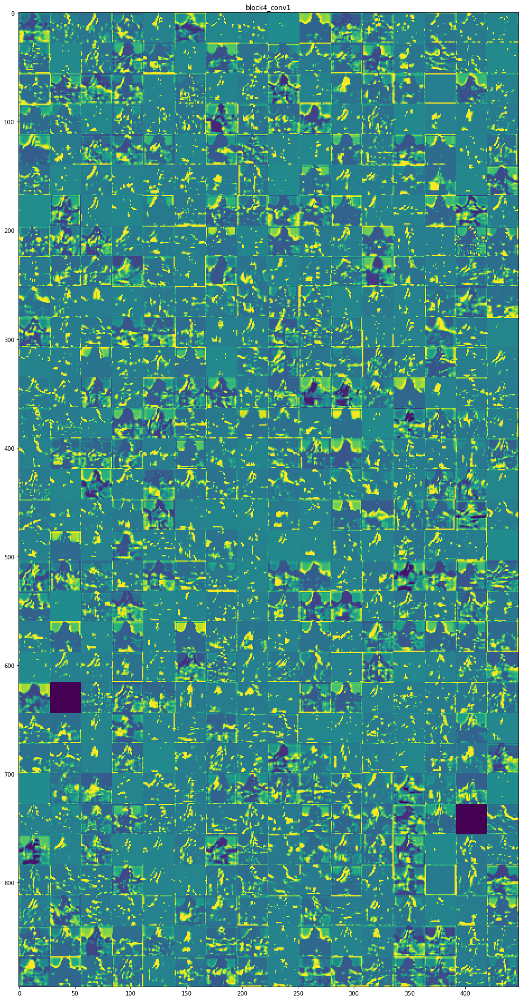

block4_conv2


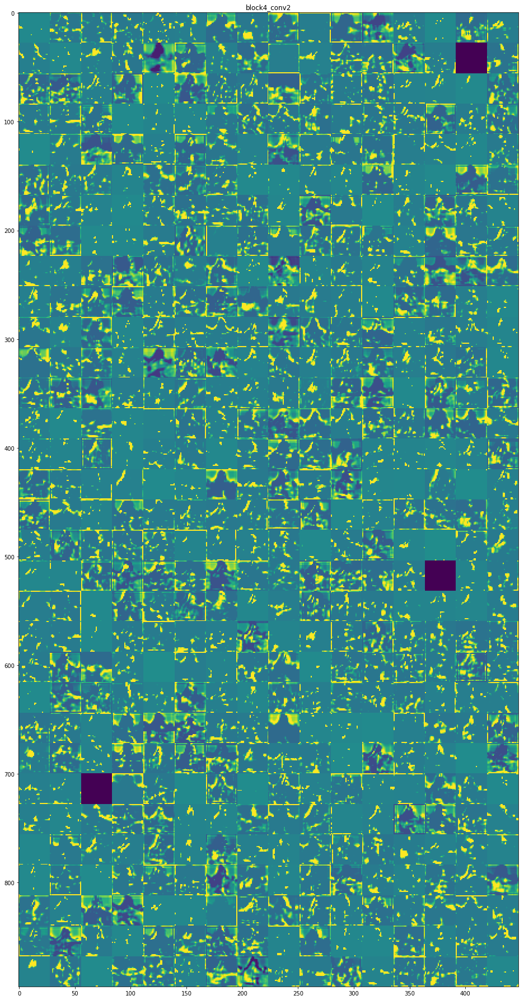

block4_conv3


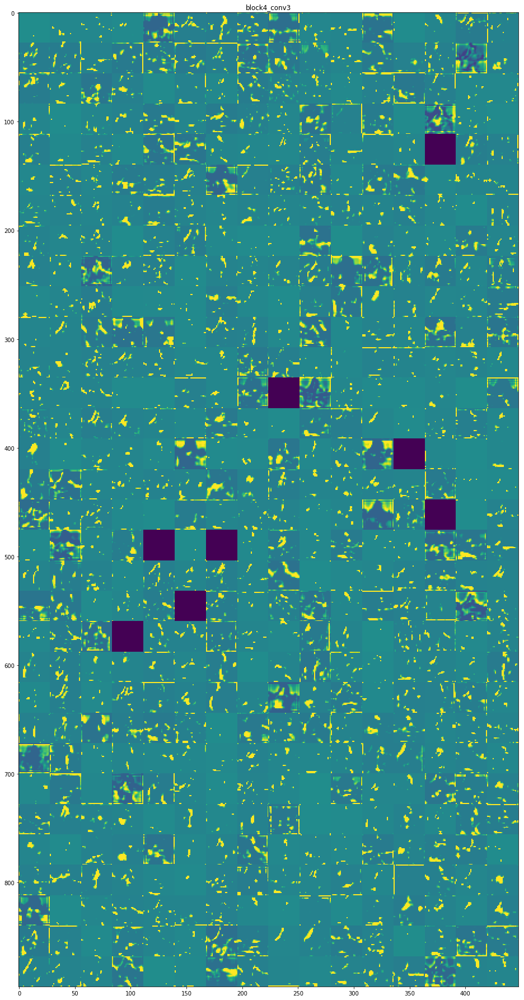

block4_pool


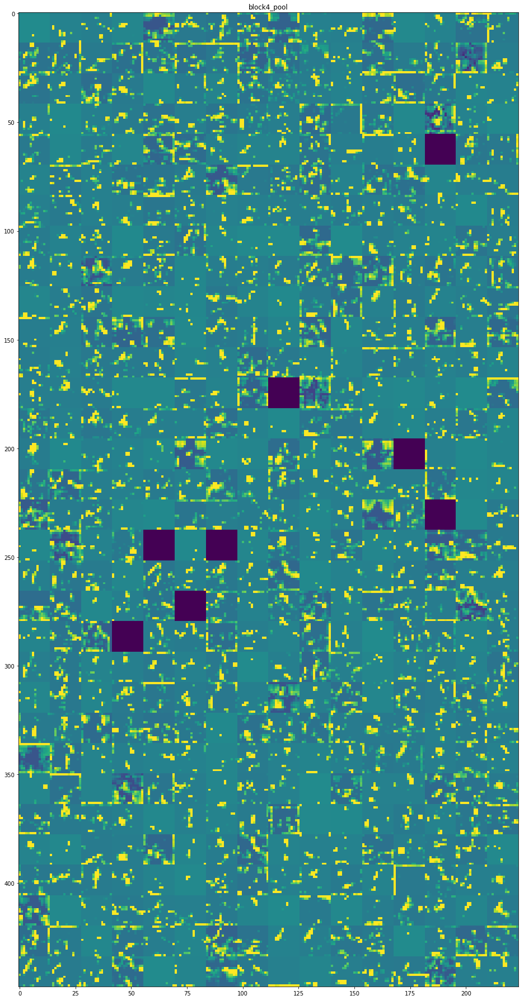

block5_conv1


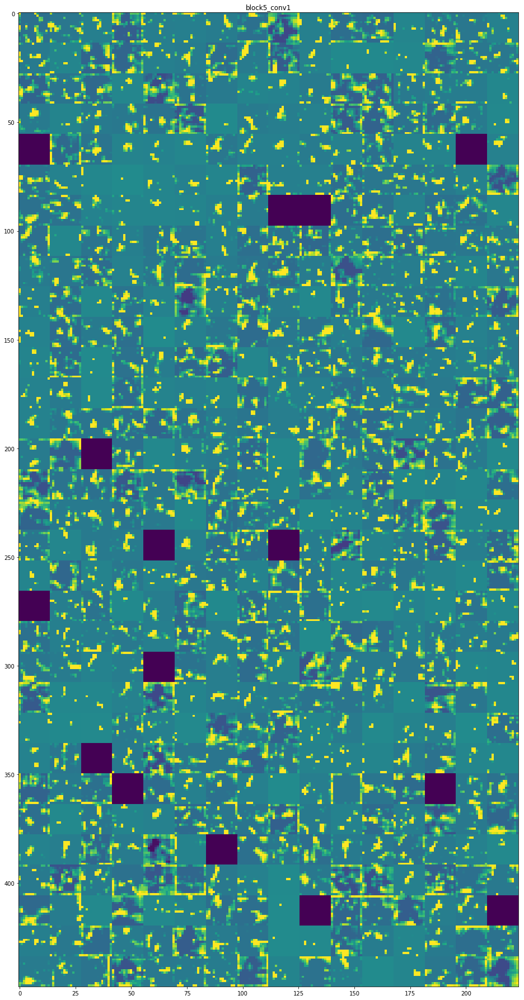

block5_conv2


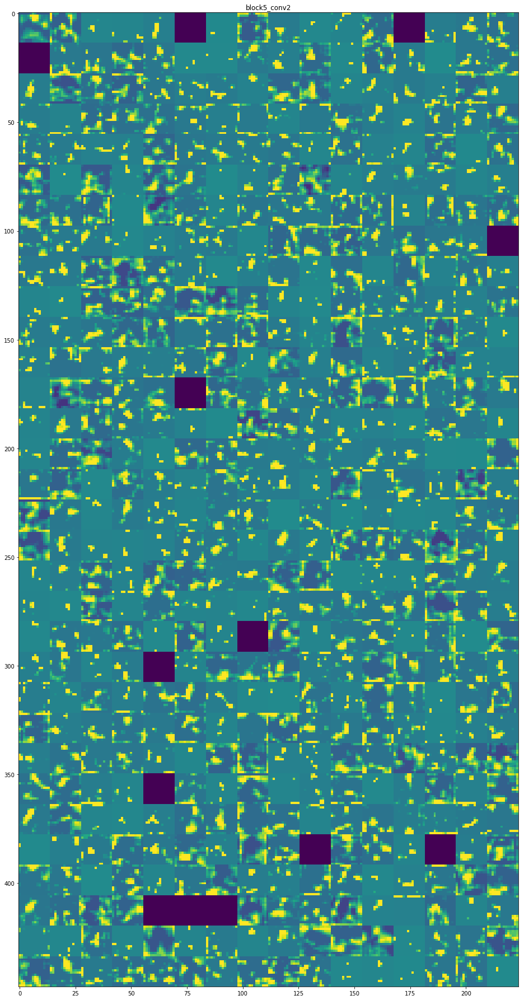

block5_conv3


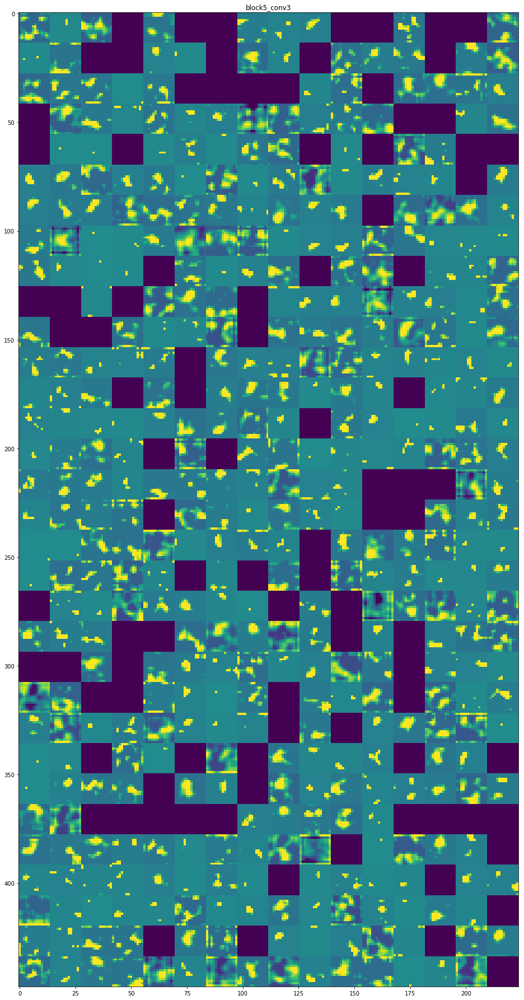

block5_pool


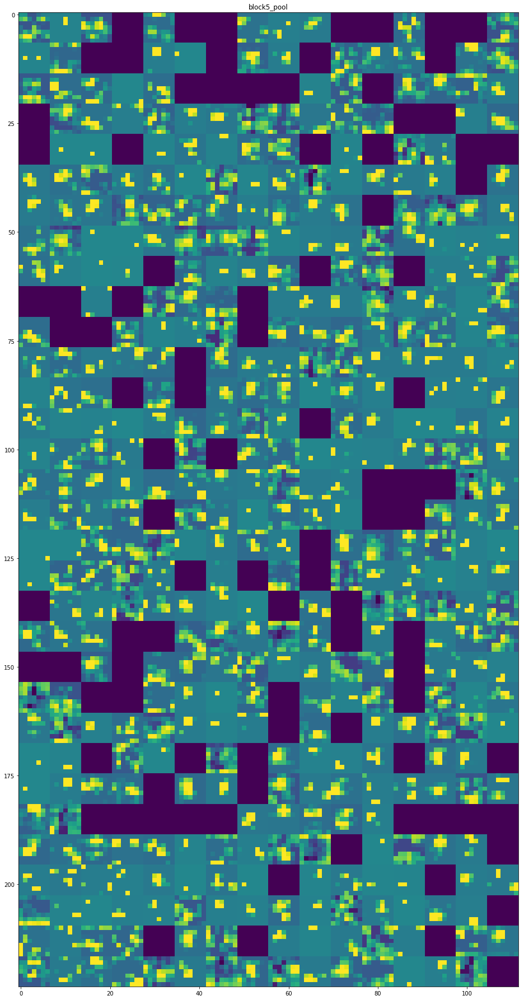

In [105]:
from time import sleep

for layer, layer_activation in zip(activation_model.layers[1:], activations[1:]):
    #if isinstance(layer, keras.layers.Conv2D):
        print(layer.name)
        visualize_activations(layer, layer_activation)
        # to prevent IOPub data rate exceeded Jupiter error
        # https://github.com/jupyter/notebook/issues/2287
        sleep(1.0)
        